### Project Details - Regression

1. Objective
2. Data Description
3. Cleaning, Wrangling & EDA (in Phython, SQL & Tableau)
4. Model Benchmarks

In [1]:
import pandas as pd
import numpy as np

from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns

#from scipy.stats import norm
#from scipy.stats import expon
#from scipy import stats

#from sklearn.preprocessing import StandardScaler
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import Normalizer

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from collections import defaultdict

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
#%matplotlib widget # zoom in/out of graphs, change their size using the mouse, navigate inside them
pd.set_option('display.max_columns', None)

In [2]:
data = pd.read_excel('regression_data.xls')
data.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,2014-10-13,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,2014-12-09,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2015-02-25,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,2014-12-09,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2015-02-18,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


### 1. Objective

**Objective**: 

The task is to build a model that will predict the price of a house based on features provided in the dataset. One of those parameters include understanding which factors are responsible for higher property value - \$650K and above. In short:

**“Predict selling prices of houses in King County, WA”**

### 2. Data Description

In [3]:
# Checking the datatypes. 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [4]:
# We are exploring the categories of the different variables to confirm the datatypes assigned.
data['view'].unique()

# data['id'].nunique()
# data['sqft_lot'].unique().max()
# data['bedrooms'].value_counts()

array([0, 3, 4, 2, 1], dtype=int64)

**From a first exploration, we can derive the following information:**

- **id**: identification number for the property (21,420 properties are listed)
- **date**: date the house was sold (between May 2014 and May 2015)
- **bedrooms**: no. of bedrooms (between 1 and 33 bedrooms)
- **bathrooms**: no. of bathrooms (between 0.5 and 8 bathrooms)
- **sqft_living**: size of living area (between 370 and 13,540 sqft)
- **sqft_lot**: size of lot (between 520 and 1,651,359 sqft)
- **floors**: no. of floors (between 1 and 3.5 floors)
- **waterfront**: house which has a view to a waterfront (**1** with waterfront and **0** without)
- **view**: no. of times the house has been viewed by potential buyers (between 0 and 4 views)
- **condition**: how good the condition is (overall) (**1** indicates worn out property and **5** excellent)
- **grade**: overall grade given to the housing unit (**1** poor ,**13** excellent, properties between 3 and 13)
- **sqft_above**: square footage of house apart from basement
- **sqft_basement**: square footage of basement
- **yr_built**: year the house was built (between 1900 and 2015)
- **yr_renovated**: year the house was renovated (**0** never, or between 1934 and 2015)
- **zipcode**: zipcode of the location 
- **lat**: geographical latitude of the location
- **long**: geographical longitude of the location
- **sqft_living15**: living area in 2015 (implies previous renovations), this might have affected the lot size
- **sqft_lot15**: lot size in 2015 (implies pevious renovations)
- **price**: price of the house (our target, between 78,000 and 7,700,000)

The id should be treated as a categorical value, since it is an identifier, not a discrete or continous numerical.

The zipcode will be treated as a categorical feature because we plan to use it to group or categorize properties by location (which entails other relevant factors such as demographic or socio-economic factors not provided in the dataset). If later on, we want to calculate distances between properties or analyze patterns in geographic location, we can use the latitude and longitude to calculate.

Hence the columns 'id' and 'zipcode' related to the location have to be changed to format 'object'.
The same applies to 'waterfront' (with or without) and 'view' (no. of views meaning interest in the property) and 'condition' (rating of condition by 13 categories). They are categorical variables.

In [5]:
# We change the datatype from int to object.
#data[['id', 'zipcode', 'waterfront', 'view', 'condition']] = data[['id', 'zipcode', 'waterfront', 'view', 'condition']].astype(object)
#data.info()

In [6]:
# Now, we are checking for NaNs. There are none.
data.isna().sum()

id               0
date             0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
price            0
dtype: int64

In [7]:
# Checking for duplicates.
duplicates = data[data.duplicated(subset='id', keep=False)]

# We add a new column 'is_duplicate' to the duplicates dataframe
duplicates['is_duplicate'] = True

if duplicates.empty:
    print("No duplicates found")
else:
    print("Duplicates found:\n", duplicates)

Duplicates found:
                id       date  bedrooms  bathrooms  sqft_living  sqft_lot  \
93     6021501535 2014-07-25         3       1.50         1580      5000   
94     6021501535 2014-12-23         3       1.50         1580      5000   
313    4139480200 2014-06-18         4       3.25         4290     12103   
314    4139480200 2014-12-09         4       3.25         4290     12103   
324    7520000520 2014-09-05         2       1.00         1240     12092   
...           ...        ...       ...        ...          ...       ...   
20654  8564860270 2015-03-30         4       2.50         2680      5539   
20763  6300000226 2014-06-26         4       1.00         1200      2171   
20764  6300000226 2015-05-04         4       1.00         1200      2171   
21564  7853420110 2014-10-03         3       3.00         2780      6000   
21565  7853420110 2015-05-04         3       3.00         2780      6000   

       floors  waterfront  view  condition  grade  sqft_above  sqft_

In [8]:
21597-21420         ######### NOT CLEAR HOW THIS SUBTRACTION IS EXPLAINED BASED ON THE CELL ABOVE #########

177

We know that the data set consists of around 21,420 properties sold between May 2014 to May 2015. There are 21,597 entries in the dataset. Hence there are 177 duplicates based on the 'id' column. The reason here is that between May 2014 and May 2015 the same house has been sold twice, hence we need to keep both. But drop the 'id' column.

In [9]:
data.drop('id', axis=1, inplace=True)

### 3. Cleaning, Wrangling & EDA (in Phython, SQL & Tableau)

In [10]:
eda_report = ProfileReport(data, title = "EDA Report - Properties")
eda_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The EDA report supports the previous findings. Now we check imbalance and deal with high correlation and multicollinearity, also indicated by the report. 

In [11]:
# Let's check the distribution of the different variables to further understand our dataset.
data.describe().round().T

,count,mean,std,min,25%,50%,75%,max
bedrooms,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,33.0
bathrooms,21597.0,2.0,1.0,0.0,2.0,2.0,2.0,8.0
sqft_living,21597.0,2080.0,918.0,370.0,1430.0,1910.0,2550.0,13540.0
sqft_lot,21597.0,15099.0,41413.0,520.0,5040.0,7618.0,10685.0,1651359.0
floors,21597.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0
waterfront,21597.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
view,21597.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0
condition,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,5.0
grade,21597.0,8.0,1.0,3.0,7.0,7.0,8.0,13.0
sqft_above,21597.0,1789.0,828.0,370.0,1190.0,1560.0,2210.0,9410.0


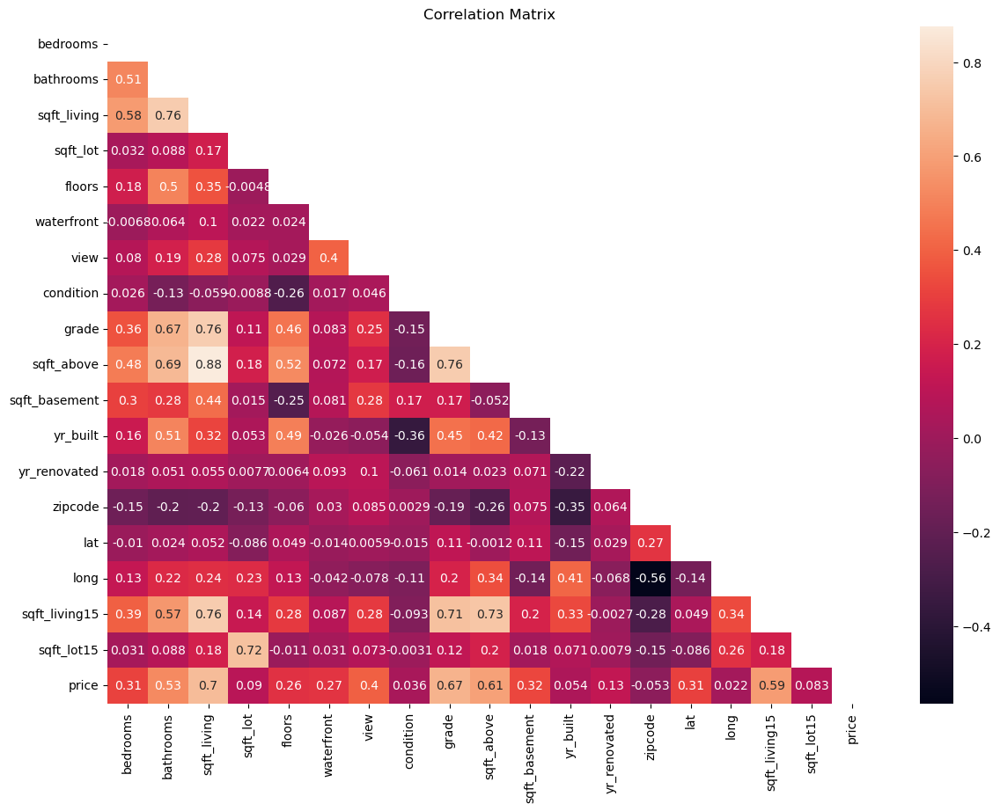

In [12]:
# We check the correlation between the numerical variables.
corr_matrix = data.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True)
plt.title('Correlation Matrix')
plt.show()

### 4. Model Benchmarks

- *X/y split*

In [19]:
numericals = data.select_dtypes(np.number)
y = data['price']
X = numericals.drop('price', axis = 1)

- *Train-test split*

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 50)

##### **Benchmark #1: Linear Regression Model**

In [21]:
model = LinearRegression(n_jobs = -1)
model.fit(X_train,y_train)

LinearRegression(n_jobs=-1)

In [22]:
lbench_pred = model.predict(X_test)
r2_lbench = r2_score(y_test, lbench_pred)

- *Evaluation metrics*

In [23]:
RMSE_lin = mean_squared_error(y_test, lbench_pred, squared=False)
MSE_lin = mean_squared_error(y_test, lbench_pred)
MAE_lin = mean_absolute_error(y_test, lbench_pred)
print("R2 = ", round(r2_lbench, 2))
print("RMSE = ", round(RMSE_lin, 2))
print("MSE = ", round(MSE_lin, 2))
print("MAE = ", round(MAE_lin, 2))

R2 =  0.69
RMSE =  200096.19
MSE =  40038486053.84
MAE =  124337.94


In [24]:
y.describe().round(2)

count      21597.00
mean      540296.57
std       367368.14
min        78000.00
25%       322000.00
50%       450000.00
75%       645000.00
max      7700000.00
Name: price, dtype: float64

<AxesSubplot:xlabel='price'>

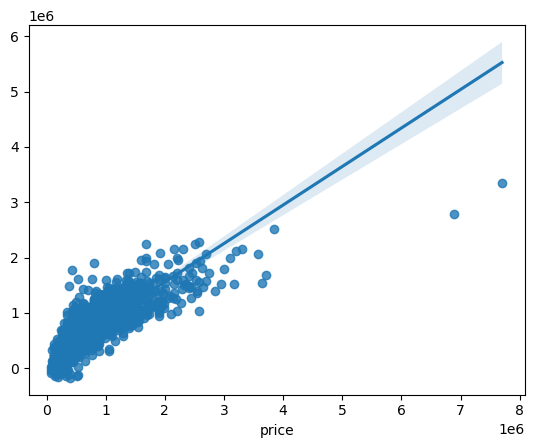

In [25]:
sns.regplot(y = lbench_pred, x = y_test)

By r2 = 0.69 alone and considering the absolute lack of preprocessing, one would get the impression that the model performs unexpctedly well. Looking at the metrics RMSE (200096.19), MAE (124337.94) and the mean (540296.57) of the target, however, it is clear that it is far from precise.
In the scatterplot above, the values seem to mainly all form one cluster, with the exception of two very clear outliers at high values of price and then a few more that can be distinguishable from the rest clustered values.

##### **Benchmark #2: K-Nearest Neighbors**

In [59]:
# This function runs the KNeighborsRegressor for values after selected intervals in a range defined by the user and:
### - produces and returns a dataframe with evaluation metrics associated with each K value
### - produces and returns a lineplot with the r2 values for each K value

def n_nbrs_comp(range):
    eval_by_neighbors = defaultdict(list) 
    k_values = []
    for i in range:   # and now to add values to the dictionary:
        if  i == 2:
            model = KNeighborsRegressor(n_neighbors = i, weights = 'distance', n_jobs=-1)
            model.fit(X_train, y_train)
            k_bench_pred = model.predict(X_test)
            r2 = r2_score(y_test, k_bench_pred)
            RMSE = mean_squared_error(y_test, k_bench_pred, squared=False)
            MSE = mean_squared_error(y_test, k_bench_pred)
            MAE = mean_absolute_error(y_test, k_bench_pred)
            eval_by_neighbors['r2'].append(round(r2, 2))
            eval_by_neighbors['RMSE'].append(round(RMSE, 2))
            eval_by_neighbors['MSE'].append(round(MSE, 2))
            eval_by_neighbors['MAE'].append(round(MAE, 2))
            k_values.append(i)
        elif i<50 and i%5==0:
            model = KNeighborsRegressor(n_neighbors = i, weights = 'distance', n_jobs=-1)
            model.fit(X_train, y_train)
            k_bench_pred = model.predict(X_test)
            r2 = r2_score(y_test, k_bench_pred)
            RMSE = mean_squared_error(y_test, k_bench_pred, squared=False)
            MSE = mean_squared_error(y_test, k_bench_pred)
            MAE = mean_absolute_error(y_test, k_bench_pred)
            eval_by_neighbors['r2'].append(round(r2, 2))
            eval_by_neighbors['RMSE'].append(round(RMSE, 2))
            eval_by_neighbors['MSE'].append(round(MSE, 2))
            eval_by_neighbors['MAE'].append(round(MAE, 2))
            k_values.append(i)
        elif i >= 50 and i % 10 == 0:
            model = KNeighborsRegressor(n_neighbors = i, weights = 'uniform', n_jobs=-1)
            model.fit(X_train, y_train)
            k_bench_pred = model.predict(X_test)
            r2 = r2_score(y_test, k_bench_pred)
            RMSE = mean_squared_error(y_test, k_bench_pred, squared=False)
            MSE = mean_squared_error(y_test, k_bench_pred)
            MAE = mean_absolute_error(y_test, k_bench_pred)
            eval_by_neighbors['r2'].append(round(r2, 2))
            eval_by_neighbors['RMSE'].append(round(RMSE, 2))
            eval_by_neighbors['MSE'].append(round(MSE, 2))
            eval_by_neighbors['MAE'].append(round(MAE, 2))
            k_values.append(i)
    eval_by_neighbors['K'] = k_values
    kbench_metrics = pd.DataFrame(eval_by_neighbors)
    kbench_metrics = kbench_metrics[['K', 'r2', 'RMSE', 'MSE', 'MAE']]
    print(kbench_metrics)
    comp_plot = plt.figure()
    plt.rcParams['figure.figsize'] = (12, 10)
    plt.plot(kbench_metrics['K'], kbench_metrics['r2'], linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
    plt.grid()
    plt.xticks(kbench_metrics.K)
    plt.title("KNNeighbors: comparison for separate n_neighbors values")
    plt.xlabel("K")
    plt.ylabel("r2")
#    plt.legend('r2', loc = 'upper right')
    plt.show()
    return kbench_metrics, comp_plot

***improvements suggested by sabina: work in progress***
----> reduce repetitions to strictly necessary

def n_neighbours_comp(range):
    eval_by_neighbors = defaultdict(list)
    k_values = []
    run_model = False
    for i in range:   # and now to add values to the dictionary:
        if  i == 2:
            run_model = True
            model = KNeighborsRegressor(n_neighbors = i, weights = 'distance', n_jobs=-1)

        elif i<50 and i%5==0:
            model = KNeighborsRegressor(n_neighbors = i, weights = 'distance', n_jobs=-1)
            k_values.append(i)

        elif i >= 50 and i % 10 == 0:
            model = KNeighborsRegressor(n_neighbors = i, weights = 'uniform', n_jobs=-1)
            k_values.append(i)

        k_values.append(i)

        model.fit(X_train, y_train)
        k_bench_pred = model.predict(X_test)
        r2 = r2_score(y_test, k_bench_pred)
        RMSE = mean_squared_error(y_test, k_bench_pred, squared=False)
        MSE = mean_squared_error(y_test, k_bench_pred)
        MAE = mean_absolute_error(y_test, k_bench_pred)
        eval_by_neighbors['r2'].append(round(r2, 2))
        eval_by_neighbors['RMSE'].append(round(RMSE, 2))
        eval_by_neighbors['MSE'].append(round(MSE, 2))
        eval_by_neighbors['MAE'].append(round(MAE, 2))
    
    eval_by_neighbors['K'] = k_values
    score_by_nbrs_df = pd.DataFrame(eval_by_neighbors)
    score_by_nbrs_df = score_by_nbrs_df[['K', 'r2', 'RMSE', 'MSE', 'MAE']]
    print(score_by_nbrs_df)

    line_plot = plt.figure()
    plt.rcParams['figure.figsize'] = (12, 10)
    
    plt.plot(k_values, score_by_nbrs_df['r2'], linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
    plt.title("KNNeighbors: comparison for separate n_neighbors values")
    plt.xlabel("K")
    plt.ylabel("r2")
    plt.legend(score_by_nbrs_df.columns, loc = 'lower right')
    return score_by_nbrs_df, line_plot


      K    r2       RMSE           MSE        MAE
0     2  0.41  277537.38  7.702700e+10  171045.78
1     5  0.49  257830.22  6.647642e+10  156630.59
2    10  0.51  254485.12  6.476267e+10  152216.22
3    15  0.50  255945.40  6.550805e+10  151664.72
4    20  0.50  256055.15  6.556424e+10  151289.96
5    25  0.49  257600.83  6.635819e+10  151166.74
6    30  0.49  259273.74  6.722287e+10  151683.37
7    35  0.48  260120.97  6.766292e+10  151854.79
8    40  0.48  261460.33  6.836150e+10  152351.68
9    45  0.47  262729.89  6.902699e+10  152867.08
10   50  0.45  268271.39  7.196954e+10  156459.64
11   60  0.44  270433.76  7.313442e+10  157799.08
12   70  0.43  272795.72  7.441751e+10  158921.16
13   80  0.43  274051.04  7.510397e+10  159709.10
14   90  0.42  275206.37  7.573854e+10  160540.45
15  100  0.42  276877.26  7.666102e+10  161396.08
16  110  0.41  278051.32  7.731254e+10  161969.53
17  120  0.41  279380.23  7.805331e+10  162680.87
18  130  0.40  280509.67  7.868567e+10  163468.86


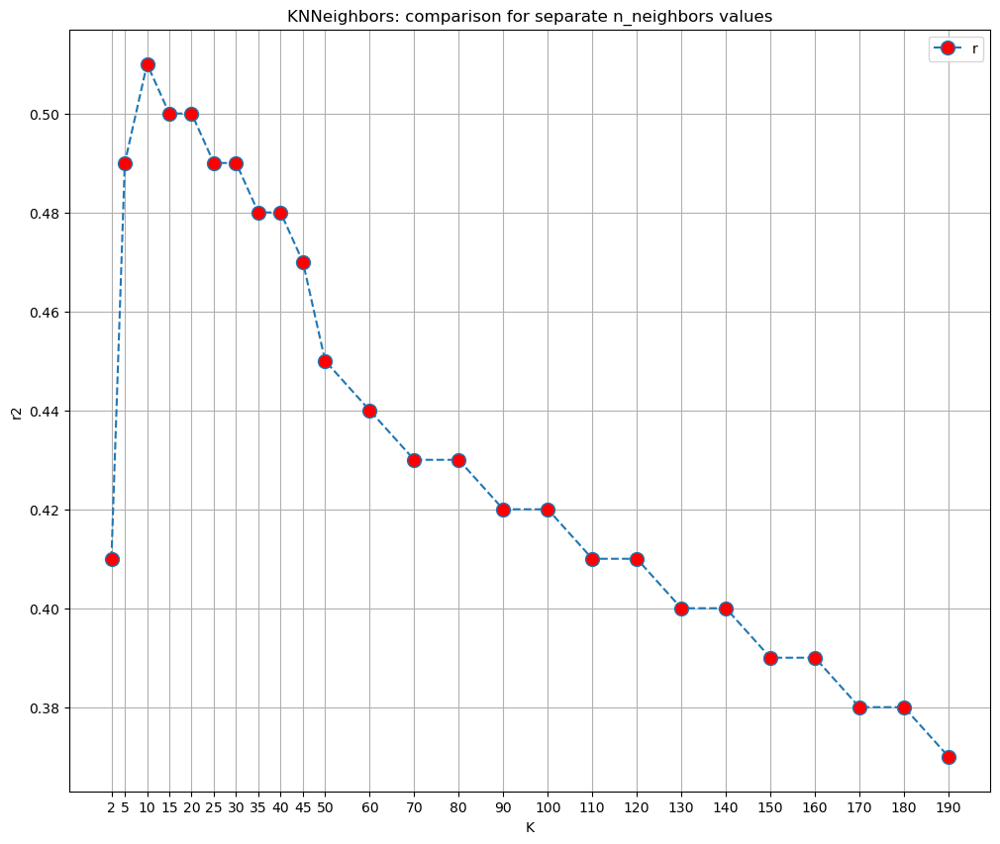

In [60]:
kbench_metrics, comp_plot = n_nbrs_comp(range(2,200))

In the case of the KNN Regression benchmark, the model was run with multiple separate values of K (nearest neighbors) and the resulted r2 scores were plotted in a lineplot. Those series of values, along with values for the metrics RMSE, MSE and MAE were stored in a separate dataframe kbench_metrics for easy access.
An immediate observation from the lineplot is that the r2 score was at its highest when neighbors were set to 10 (r2 = 0.51). Looking at the rest of the evaluation metrics, for K = 10, the RMSE (254485.12) and MSE (6.476267e+10) are at their lowest, while the MAE (152216.22) although not at its minimum value, isn't very different from it either as shown below:

In [64]:
round(kbench_metrics['MAE'][2] - min(kbench_metrics['MAE']), 2)

1049.48

In [37]:
kbench_metrics

,K,r2,RMSE,MSE,MAE
0,2,0.41,277537.38,7.702700e+10,171045.78
1,5,0.49,257830.22,6.647642e+10,156630.59
2,10,0.51,254485.12,6.476267e+10,152216.22
3,15,0.50,255945.40,6.550805e+10,151664.72
4,20,0.50,256055.15,6.556424e+10,151289.96
5,25,0.49,257600.83,6.635819e+10,151166.74
6,30,0.49,259273.74,6.722287e+10,151683.37
7,35,0.48,260120.97,6.766292e+10,151854.79
8,40,0.48,261460.33,6.836150e+10,152351.68
9,45,0.47,262729.89,6.902699e+10,152867.08
